<a href="https://colab.research.google.com/github/m04013jo/2024OHCA/blob/main/240417_OHCA(XGBoost)Tokyofiredata.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import numpy as  np
import matplotlib.pyplot  as plt
%matplotlib inline
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import learning_curve
from sklearn.model_selection import validation_curve
from sklearn.metrics import mean_squared_error

In [ ]:
df = pd.read_csv('/content/20230124TokyoFire.csv')
#del df['Unnamed: 0']
print(df.shape,df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11614 entries, 0 to 11613
Data columns (total 57 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   ID                 11614 non-null  object
 1   消防本部コード            11614 non-null  object
 2   隊コード               11614 non-null  object
 3   救命士乗車有無フラグ         11614 non-null  object
 4   乗車人数               11614 non-null  object
 5   救命士数               11614 non-null  object
 6   医師同乗の有無フラグ         11614 non-null  object
 7   医師による二次救命処置        11614 non-null  object
 8   覚知年                11614 non-null  object
 9   覚知月                11614 non-null  object
 10  覚知時分               11614 non-null  object
 11  最先現着時分             11614 non-null  object
 12  最先接触時分             11614 non-null  object
 13  最先ＣＰＲ開始時分          11537 non-null  object
 14  車内収容時分             11614 non-null  object
 15  現発時分               11614 non-null  object
 16  病着時分               11614 non-null  objec

In [ ]:
# outputデータ確認 処置に関して
print(df['【医師検証】処置標準通り'].value_counts(),len(df[df['【医師検証】処置標準通り']=='1'])/len(df['【医師検証】処置標準通り']))
print(df['【医師検証】処置署所等で確認'].value_counts())
print(df['【医師検証】処置事例研究を考慮'].value_counts())
# 標準通り≠　確認＋事例研究⇦確認必要

【医師検証】処置標準通り
1               10000
0                1610
【医師検証】処置標準通り        4
Name: count, dtype: int64 0.8610297916307904
【医師検証】処置署所等で確認
0                 10117
1                  1493
【医師検証】処置署所等で確認        4
Name: count, dtype: int64
【医師検証】処置事例研究を考慮
0                  11575
1                     35
【医師検証】処置事例研究を考慮        4
Name: count, dtype: int64


In [ ]:
# outputデータ確認 観察事例に関して
print(df['【医師検証】観察標準通り'].value_counts(),len(df[df['【医師検証】観察標準通り']=='1'])/len(df['【医師検証】観察標準通り']))
print(df['【医師検証】観察署所等で確認'].value_counts())
print(df['【医師検証】観察事例研究を考慮'].value_counts())
# 標準通り≠　確認＋事例研究⇦確認必要

【医師検証】観察標準通り
1               11390
0                 220
【医師検証】観察標準通り        4
Name: count, dtype: int64 0.9807129326674703
【医師検証】観察署所等で確認
0                 11394
1                   216
【医師検証】観察署所等で確認        4
Name: count, dtype: int64
【医師検証】観察事例研究を考慮
0                  11596
1                     14
【医師検証】観察事例研究を考慮        4
Name: count, dtype: int64


In [ ]:
# outputデータ確認 病院選定に関して
print(df['【医師検証】病院選定標準通り'].value_counts(),len(df[df['【医師検証】病院選定標準通り']=='1'])/len(df['【医師検証】病院選定標準通り']))
print(df['【医師検証】病院選定署所等で確認'].value_counts())
print(df['【医師検証】病院選定事例研究を考慮'].value_counts())
# 標準通り≠　確認＋事例研究⇦確認必要

【医師検証】病院選定標準通り
1                 10753
0                   857
【医師検証】病院選定標準通り        4
Name: count, dtype: int64 0.925865334940589
【医師検証】病院選定署所等で確認
0                   10856
1                     754
【医師検証】病院選定署所等で確認        4
Name: count, dtype: int64
【医師検証】病院選定事例研究を考慮
0                    11605
1                        5
【医師検証】病院選定事例研究を考慮        4
Name: count, dtype: int64


In [ ]:
 len(df[(df['【医師検証】病院選定標準通り']=='1') & (df['【医師検証】観察標準通り'] == '1') & (df['【医師検証】処置標準通り'] =='1')])/len(df)
# 和歌山県と割合大体同じ！！

0.8227139659032202

In [ ]:
df.info()
df["year"] = df["date"].str.split("-")
#t = df8["year"][0]
#print(''.join(t))
df["Date"]= df["year"].map(lambda x : ''.join(x)).astype(int)
#df7.info()
df["Date"].value_counts()
df.drop(columns=["date"], axis=1, inplace=True)
df.asytpe(int)
#join(df8["year"])

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5620 entries, 0 to 5619
Data columns (total 75 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Fire_code   5620 non-null   int64  
 1   EMS_code    5620 non-null   int64  
 2   Year        5620 non-null   int64  
 3   Gender      5620 non-null   int64  
 4   Age         5620 non-null   int64  
 5   P_EMT       5620 non-null   int64  
 6   N_P_C       4890 non-null   float64
 7   N_P_EMT     5620 non-null   int64  
 8   P_Inc       4703 non-null   float64
 9   P_drug      4649 non-null   float64
 10  P_Beta      2362 non-null   float64
 11  P_Glu       4046 non-null   float64
 12  P_IV        4054 non-null   float64
 13  P_NonC      2342 non-null   float64
 14  P_ERP       5620 non-null   int64  
 15  ALS         5620 non-null   int64  
 16  Witness     5620 non-null   int64  
 17  T_Wit       2562 non-null   object 
 18  Type_By     5620 non-null   int64  
 19  P_BYS       5620 non-null  

KeyError: ignored

In [ ]:
#df.drop(columns=["year"], axis=1, inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5620 entries, 0 to 5619
Data columns (total 74 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Fire_code   5620 non-null   int64  
 1   EMS_code    5620 non-null   int64  
 2   Year        5620 non-null   int64  
 3   Gender      5620 non-null   int64  
 4   Age         5620 non-null   int64  
 5   P_EMT       5620 non-null   int64  
 6   N_P_C       4890 non-null   float64
 7   N_P_EMT     5620 non-null   int64  
 8   P_Inc       4703 non-null   float64
 9   P_drug      4649 non-null   float64
 10  P_Beta      2362 non-null   float64
 11  P_Glu       4046 non-null   float64
 12  P_IV        4054 non-null   float64
 13  P_NonC      2342 non-null   float64
 14  P_ERP       5620 non-null   int64  
 15  ALS         5620 non-null   int64  
 16  Witness     5620 non-null   int64  
 17  T_Wit       2562 non-null   object 
 18  Type_By     5620 non-null   int64  
 19  P_BYS       5620 non-null  

In [ ]:
df['Eval'].value_counts()
#偏りありすぎ -> oversampling

B    4526
C     736
A     235
D     123
Name: Eval, dtype: int64

In [ ]:
#時間経過削除
df2 = df[~((df['Dep_Con'] < 0) | (df['Drug_Con'] < 0)| (df['Arr_Aw'] < 0)| (df['AirM_Con'] < 0)| (df['AH_Dep'] < 0)| (df['Def_Con'] < 0))]
df2.describe()

,Fire_code,EMS_code,Year,Gender,Age,P_EMT,N_P_C,N_P_EMT,P_Inc,P_drug,P_Beta,P_Glu,P_IV,P_NonC,P_ERP,ALS,Witness,Type_By,P_BYS,BYSChest,BYSArtP,AEDBYB,N_BYSAED,P_CPR,Po_AEDBYB,Inst,Type_ier,P_Def,Type_Def,N_Def,Def_EMT,Def_EMS,Def_Fire,Def_Non,AirM,P_AirM,Type_AirM,P_DIV,N_Drug,Type_CA,Type_CCA,Aet_NCCA,Site,Type_Site,Floor_Site,PreRPOSC,Sur,CPC,OPC,Sign_Death,Arr_Aw,CPR_Con,Def_Con,Drug_Con,Dep_Con,AirM_Con,AH_Dep
count,5609.000000,5609.000000,5609.000000,5609.000000,5609.000000,5609.000000,4883.000000,5609.000000,4698.000000,4644.000000,2358.000000,4042.000000,4050.000000,2339.000000,5609.000000,5609.000000,5609.000000,5609.000000,5609.000000,3780.000000,2276.000000,2058.000000,1228.000000,2920.000000,619.000000,5609.000000,5609.000000,5609.000000,691.000000,1797.000000,2830.000000,2585.000000,2569.000000,2570.000000,5609.000000,5609.000000,5609.000000,5609.000000,5609.000000,5609.000000,5609.000000,5609.000000,5609.000000,5609.000000,5609.000000,5609.000000,5609.000000,5609.000000,5609.000000,4831.000000,5609.000000,5430.000000,624.000000,1094.000000,4855.000000,3596.000000,4855.000000
mean,304321.517204,9.706186,2015.821180,1.418791,76.253521,1.010519,3.200082,1.606882,0.952746,0.938415,0.049618,0.838446,0.838765,0.251817,1.915136,1.735069,1.544126,1.519344,1.487074,0.758466,0.179262,0.034014,0.087948,1.572260,1.387722,0.560884,3.578356,0.111250,0.910275,0.858653,0.212721,0.012379,0.000779,0.000389,0.858977,0.747549,1.612587,0.455340,0.397397,1.531289,0.800677,2.167410,1.657693,1.047067,1.659476,1.874666,1.932787,4.821537,4.824568,1.978472,544.546265,132.718232,469.711538,18.600548,11.560247,457.725250,847.884655
std,2929.327458,12.322635,2.984854,0.493405,15.059023,0.102030,0.813840,0.596915,0.212205,0.240426,0.217201,0.368086,0.367793,0.434150,0.278703,0.441336,0.498094,2.421822,0.499877,0.428070,0.383656,0.181308,0.486577,0.559803,0.711608,0.496324,0.866829,0.314469,0.310299,1.672205,0.409304,0.110592,0.027896,0.019726,0.348077,0.434458,0.994739,0.498046,0.975192,0.499065,0.907564,2.458856,1.147687,0.211802,1.909022,0.331127,0.250414,0.754960,0.743658,0.145150,310.137006,1579.610720,561.619917,63.878247,22.930576,1977.119763,833.405227
min,302015.000000,1.000000,2011.000000,1.000000,18.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,2.000000,1.000000,0.000000,0.000000
25%,302058.000000,1.000000,2013.000000,1.000000,69.000000,1.000000,3.000000,1.000000,1.000000,1.000000,0.000000,1.000000,1.000000,0.000000,2.000000,1.000000,1.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,3.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,1.000000,1.000000,2.000000,2.000000,5.000000,5.000000,2.000000,360.000000,0.000000,60.000000,10.000000,8.000000,240.000000,420.000000
50%,302074.000000,3.000000,2016.000000,1.000000,80.000000,1.000000,3.000000,2.000000,1.000000,1.000000,0.000000,1.000000,1.000000,0.000000,2.000000,2.000000,2.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,2.000000,1.000000,1.000000,4.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,2.000000,0.000000,0.000000,2.000000,0.000000,1.000000,1.000000,1.000000,1.000000,2.000000,2.000000,5.000000,5.000000,2.000000,480.000000,0.000000,180.000000,14.000000,10.000000,300.000000,600.000000
75%,308773.000000,16.000000,2019.000000,2.000000,87.000000,1.000000,4.000000,2.000000,1.000000,1.000000,0.000000,1.000000,1.000000,1.000000,2.000000,2.000000,2.000000,1.000000,2.000000,1.000000,0.000000,0.000000,0.000000,2.0

In [ ]:
df3 = df2.drop(df2.columns[9:15], axis=1)
#df4 = df3.drop(df3.columns[9:15], axis=1)
df3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5609 entries, 0 to 5619
Data columns (total 68 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Fire_code   5609 non-null   int64  
 1   EMS_code    5609 non-null   int64  
 2   Year        5609 non-null   int64  
 3   date        5609 non-null   object 
 4   Gender      5609 non-null   int64  
 5   Age         5609 non-null   int64  
 6   P_EMT       5609 non-null   int64  
 7   N_P_C       4883 non-null   float64
 8   N_P_EMT     5609 non-null   int64  
 9   P_ERP       5609 non-null   int64  
 10  ALS         5609 non-null   int64  
 11  Witness     5609 non-null   int64  
 12  T_Wit       2557 non-null   object 
 13  Type_By     5609 non-null   int64  
 14  P_BYS       5609 non-null   int64  
 15  BYSChest    3780 non-null   float64
 16  BYSArtP     2276 non-null   float64
 17  AEDBYB      2058 non-null   float64
 18  N_BYSAED    1228 non-null   float64
 19  P_CPR       2920 non-null  

In [ ]:
df4 = df3.drop(df3.columns[13:22],axis=1)
df4.info()
df4["Year"].value_counts()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5609 entries, 0 to 5619
Data columns (total 59 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Fire_code   5609 non-null   int64  
 1   EMS_code    5609 non-null   int64  
 2   Year        5609 non-null   int64  
 3   date        5609 non-null   object 
 4   Gender      5609 non-null   int64  
 5   Age         5609 non-null   int64  
 6   P_EMT       5609 non-null   int64  
 7   N_P_C       4883 non-null   float64
 8   N_P_EMT     5609 non-null   int64  
 9   P_ERP       5609 non-null   int64  
 10  ALS         5609 non-null   int64  
 11  Witness     5609 non-null   int64  
 12  T_Wit       2557 non-null   object 
 13  T_byDef     62 non-null     object 
 14  Inst        5609 non-null   int64  
 15  Type_ier    5609 non-null   int64  
 16  P_Def       5609 non-null   int64  
 17  Type_Def    691 non-null    float64
 18  T_Def       624 non-null    object 
 19  N_Def       1797 non-null  

2020    778
2019    727
2012    549
2013    542
2014    526
2016    517
2017    510
2018    504
2011    496
2015    460
Name: Year, dtype: int64

In [ ]:
df5 = df4.drop(columns=['Type_Def','N_Def', 'P_ERP','N_P_C','P_EMT','Year','T_byDef','T_Def','T_AirM','T_Drug','T_Aware','T_con','T_CPR','T_Incar','T_Dep','T_ROSC','T_Wit','T_Arri','T_AH','T_IH'], axis=1)
df5.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5609 entries, 0 to 5619
Data columns (total 39 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Fire_code   5609 non-null   int64  
 1   EMS_code    5609 non-null   int64  
 2   date        5609 non-null   object 
 3   Gender      5609 non-null   int64  
 4   Age         5609 non-null   int64  
 5   N_P_EMT     5609 non-null   int64  
 6   ALS         5609 non-null   int64  
 7   Witness     5609 non-null   int64  
 8   Inst        5609 non-null   int64  
 9   Type_ier    5609 non-null   int64  
 10  P_Def       5609 non-null   int64  
 11  Def_EMT     2830 non-null   float64
 12  Def_EMS     2585 non-null   float64
 13  Def_Fire    2569 non-null   float64
 14  Def_Non     2570 non-null   float64
 15  AirM        5609 non-null   int64  
 16  P_AirM      5609 non-null   int64  
 17  Type_AirM   5609 non-null   int64  
 18  P_DIV       5609 non-null   int64  
 19  N_Drug      5609 non-null  

In [ ]:
df6 = df5.drop(df5.columns[11:15],axis=1)
df6.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5609 entries, 0 to 5619
Data columns (total 35 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Fire_code   5609 non-null   int64  
 1   EMS_code    5609 non-null   int64  
 2   date        5609 non-null   object 
 3   Gender      5609 non-null   int64  
 4   Age         5609 non-null   int64  
 5   N_P_EMT     5609 non-null   int64  
 6   ALS         5609 non-null   int64  
 7   Witness     5609 non-null   int64  
 8   Inst        5609 non-null   int64  
 9   Type_ier    5609 non-null   int64  
 10  P_Def       5609 non-null   int64  
 11  AirM        5609 non-null   int64  
 12  P_AirM      5609 non-null   int64  
 13  Type_AirM   5609 non-null   int64  
 14  P_DIV       5609 non-null   int64  
 15  N_Drug      5609 non-null   int64  
 16  Type_CA     5609 non-null   int64  
 17  Type_CCA    5609 non-null   int64  
 18  Aet_NCCA    5609 non-null   int64  
 19  Site        5609 non-null  

In [ ]:
df7 = df6.drop(columns=['Sur','CPC', 'OPC'], axis=1)
df7.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5609 entries, 0 to 5619
Data columns (total 32 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Fire_code   5609 non-null   int64  
 1   EMS_code    5609 non-null   int64  
 2   date        5609 non-null   object 
 3   Gender      5609 non-null   int64  
 4   Age         5609 non-null   int64  
 5   N_P_EMT     5609 non-null   int64  
 6   ALS         5609 non-null   int64  
 7   Witness     5609 non-null   int64  
 8   Inst        5609 non-null   int64  
 9   Type_ier    5609 non-null   int64  
 10  P_Def       5609 non-null   int64  
 11  AirM        5609 non-null   int64  
 12  P_AirM      5609 non-null   int64  
 13  Type_AirM   5609 non-null   int64  
 14  P_DIV       5609 non-null   int64  
 15  N_Drug      5609 non-null   int64  
 16  Type_CA     5609 non-null   int64  
 17  Type_CCA    5609 non-null   int64  
 18  Aet_NCCA    5609 non-null   int64  
 19  Site        5609 non-null  

In [ ]:
df7["year"] = df7["date"].str.split("-")
#t = df8["year"][0]
#print(''.join(t))
df7["Date"]= df7["year"].map(lambda x : ''.join(x)).astype(int)
#df7.info()
df7["Date"].value_counts()
df7.drop(columns=["date"], axis=1, inplace=True)
#join(df8["year"])

In [ ]:
df7.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5609 entries, 0 to 5619
Data columns (total 33 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Fire_code   5609 non-null   int64  
 1   EMS_code    5609 non-null   int64  
 2   Gender      5609 non-null   int64  
 3   Age         5609 non-null   int64  
 4   N_P_EMT     5609 non-null   int64  
 5   ALS         5609 non-null   int64  
 6   Witness     5609 non-null   int64  
 7   Inst        5609 non-null   int64  
 8   Type_ier    5609 non-null   int64  
 9   P_Def       5609 non-null   int64  
 10  AirM        5609 non-null   int64  
 11  P_AirM      5609 non-null   int64  
 12  Type_AirM   5609 non-null   int64  
 13  P_DIV       5609 non-null   int64  
 14  N_Drug      5609 non-null   int64  
 15  Type_CA     5609 non-null   int64  
 16  Type_CCA    5609 non-null   int64  
 17  Aet_NCCA    5609 non-null   int64  
 18  Site        5609 non-null   int64  
 19  Type_Site   5609 non-null  

In [ ]:
df8= df7
df8["Sign_Death"] = df7["Sign_Death"].fillna(2)
df8["Sign_Death"].astype(int).value_counts()

2    5505
1     104
Name: Sign_Death, dtype: int64

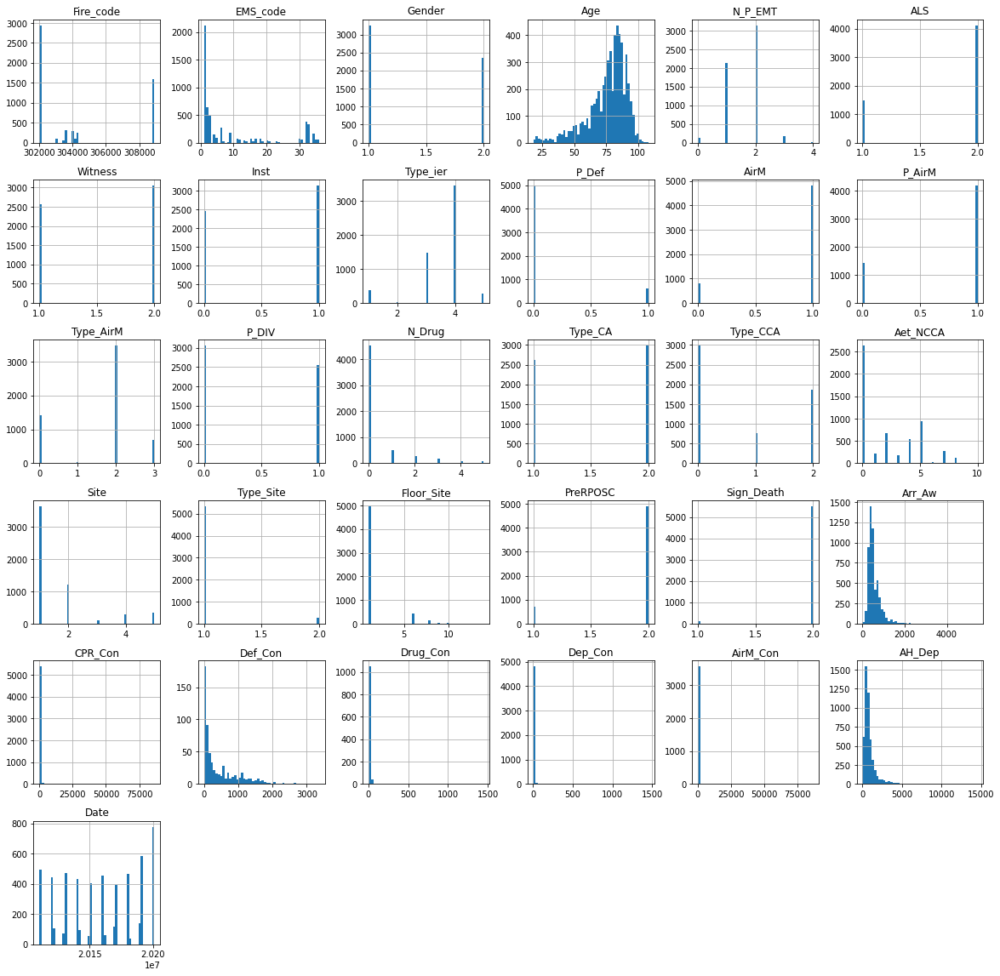

In [ ]:
df8.hist(bins=50, figsize=(20,20));

In [ ]:
df9 = df8.drop(columns=["Inst","Type_ier","AirM","Type_CCA"],axis=1)
df9.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5609 entries, 0 to 5619
Data columns (total 29 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Fire_code   5609 non-null   int64  
 1   EMS_code    5609 non-null   int64  
 2   Gender      5609 non-null   int64  
 3   Age         5609 non-null   int64  
 4   N_P_EMT     5609 non-null   int64  
 5   ALS         5609 non-null   int64  
 6   Witness     5609 non-null   int64  
 7   P_Def       5609 non-null   int64  
 8   P_AirM      5609 non-null   int64  
 9   Type_AirM   5609 non-null   int64  
 10  P_DIV       5609 non-null   int64  
 11  N_Drug      5609 non-null   int64  
 12  Type_CA     5609 non-null   int64  
 13  Aet_NCCA    5609 non-null   int64  
 14  Site        5609 non-null   int64  
 15  Type_Site   5609 non-null   int64  
 16  Floor_Site  5609 non-null   int64  
 17  PreRPOSC    5609 non-null   int64  
 18  Sign_Death  5609 non-null   float64
 19  Eval        5609 non-null  

In [ ]:
df9.drop(columns=["year","Fire_code","EMS_code"],axis=1, inplace=True)
df9.info()

KeyError: ignored

In [ ]:
df9.drop(columns=["Type_Site","Sign_Death","Def_Con","Drug_Con","Site","P_AirM","N_Drug"],axis=1, inplace=True)
df9.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5609 entries, 0 to 5619
Data columns (total 19 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Gender      5609 non-null   int64  
 1   Age         5609 non-null   int64  
 2   N_P_EMT     5609 non-null   int64  
 3   ALS         5609 non-null   int64  
 4   Witness     5609 non-null   int64  
 5   P_Def       5609 non-null   int64  
 6   Type_AirM   5609 non-null   int64  
 7   P_DIV       5609 non-null   int64  
 8   Type_CA     5609 non-null   int64  
 9   Aet_NCCA    5609 non-null   int64  
 10  Floor_Site  5609 non-null   int64  
 11  PreRPOSC    5609 non-null   int64  
 12  Eval        5609 non-null   object 
 13  Arr_Aw      5609 non-null   int64  
 14  CPR_Con     5430 non-null   float64
 15  Dep_Con     4855 non-null   float64
 16  AirM_Con    3596 non-null   float64
 17  AH_Dep      4855 non-null   float64
 18  Date        5609 non-null   int64  
dtypes: float64(4), int64(14), o

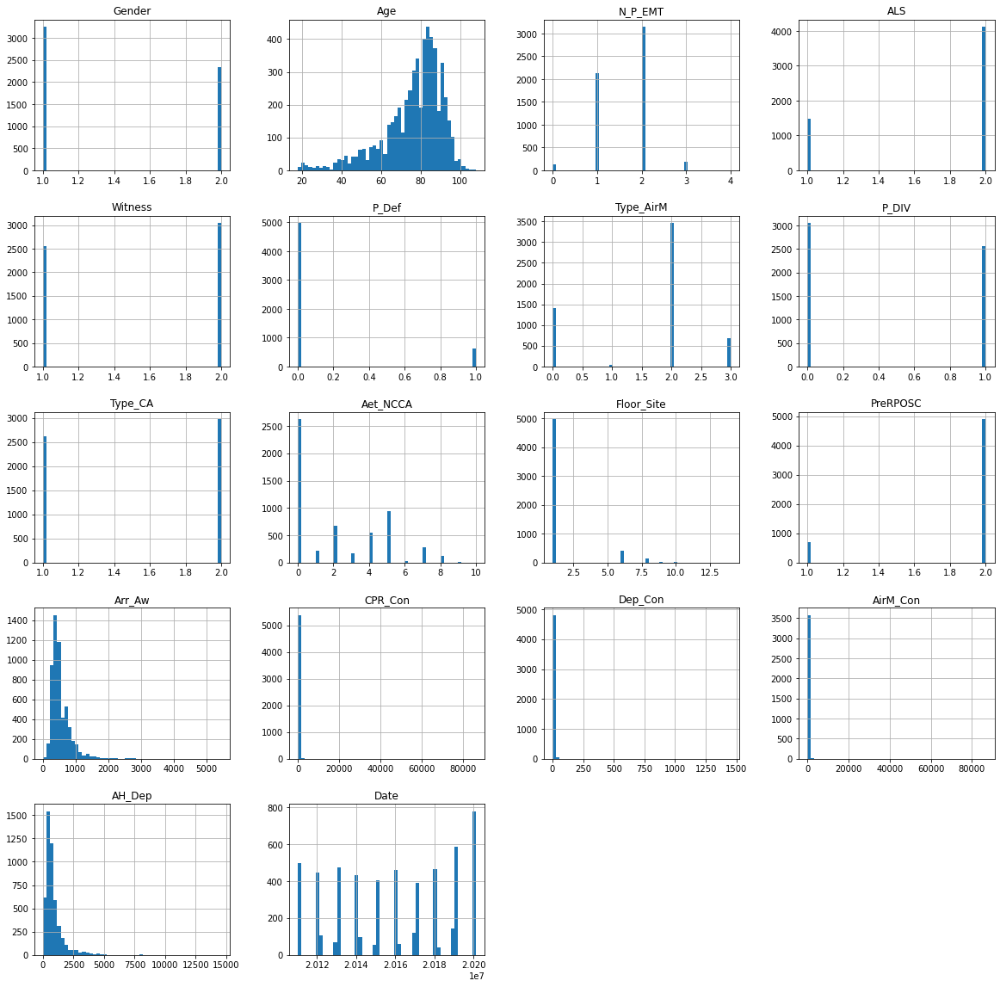

In [ ]:
df9.hist(bins=50, figsize=(20,20));

In [ ]:
sns.pairplot(df, hue='Eval')
plt.show()

In [ ]:
df10=df9
df10["CPR_Con"]=df10["CPR_Con"].fillna(df10["CPR_Con"].median())
df10["Def_Con"]=df10["Def_Con"].fillna(df10["Def_Con"].median())
df10["Drug_Con"]=df10["Drug_Con"].fillna(df10["Drug_Con"].median())
df10["Dep_Con"]=df10["Dep_Con"].fillna(df10["Dep_Con"].median())
df10["AirM_Con"]=df10["AirM_Con"].fillna(df10["AirM_Con"].median())
df10["AH_Dep"]=df10["AH_Dep"].fillna(df10["AH_Dep"].median())
df10.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5609 entries, 0 to 5619
Data columns (total 29 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Fire_code   5609 non-null   int64  
 1   EMS_code    5609 non-null   int64  
 2   Gender      5609 non-null   int64  
 3   Age         5609 non-null   int64  
 4   N_P_EMT     5609 non-null   int64  
 5   ALS         5609 non-null   int64  
 6   Witness     5609 non-null   int64  
 7   P_Def       5609 non-null   int64  
 8   P_AirM      5609 non-null   int64  
 9   Type_AirM   5609 non-null   int64  
 10  P_DIV       5609 non-null   int64  
 11  N_Drug      5609 non-null   int64  
 12  Type_CA     5609 non-null   int64  
 13  Aet_NCCA    5609 non-null   int64  
 14  Site        5609 non-null   int64  
 15  Type_Site   5609 non-null   int64  
 16  Floor_Site  5609 non-null   int64  
 17  PreRPOSC    5609 non-null   int64  
 18  Sign_Death  5609 non-null   float64
 19  Eval        5609 non-null  

In [ ]:
df9["Eval"]=df9["Eval"].replace('A','0')
df9["Eval"]=df9["Eval"].replace('B','0')
df9["Eval"]=df9["Eval"].replace('C','1')
df9["Eval"]=df9["Eval"].replace('D','1')
df9['Eval']
#df9['Eval']=df9['Eval'].replace({'A':0,'B':0,'C':1,'D':1})
#df9['Eval']
df9['Eval'].value_counts()

0    4752
1     857
Name: Eval, dtype: int64

In [ ]:
#df9["Sigh_Death"]= df9["Sign_Death"].astype(int)
df9['Eval']=df9['Eval'].astype(int)

In [ ]:
df9.info()
df9[["ALS","Witness","P_Def","Type_AirM","P_DIV","Type_CA","Aet_NCCA","PreRPOSC"]] = df[["ALS","Witness","P_Def","Type_AirM","P_DIV","Type_CA","Aet_NCCA","PreRPOSC"]].astype('category')

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5609 entries, 0 to 5619
Data columns (total 19 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Gender      5609 non-null   int64  
 1   Age         5609 non-null   int64  
 2   N_P_EMT     5609 non-null   int64  
 3   ALS         5609 non-null   int64  
 4   Witness     5609 non-null   int64  
 5   P_Def       5609 non-null   int64  
 6   Type_AirM   5609 non-null   int64  
 7   P_DIV       5609 non-null   int64  
 8   Type_CA     5609 non-null   int64  
 9   Aet_NCCA    5609 non-null   int64  
 10  Floor_Site  5609 non-null   int64  
 11  PreRPOSC    5609 non-null   int64  
 12  Eval        5609 non-null   int64  
 13  Arr_Aw      5609 non-null   int64  
 14  CPR_Con     5430 non-null   float64
 15  Dep_Con     4855 non-null   float64
 16  AirM_Con    3596 non-null   float64
 17  AH_Dep      4855 non-null   float64
 18  Date        5609 non-null   int64  
dtypes: float64(4), int64(15)
me

In [ ]:
df9.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5609 entries, 0 to 5619
Data columns (total 19 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   Gender      5609 non-null   int64   
 1   Age         5609 non-null   int64   
 2   N_P_EMT     5609 non-null   int64   
 3   ALS         5609 non-null   category
 4   Witness     5609 non-null   category
 5   P_Def       5609 non-null   category
 6   Type_AirM   5609 non-null   category
 7   P_DIV       5609 non-null   category
 8   Type_CA     5609 non-null   category
 9   Aet_NCCA    5609 non-null   category
 10  Floor_Site  5609 non-null   int64   
 11  PreRPOSC    5609 non-null   category
 12  Eval        5609 non-null   int64   
 13  Arr_Aw      5609 non-null   int64   
 14  CPR_Con     5430 non-null   float64 
 15  Dep_Con     4855 non-null   float64 
 16  AirM_Con    3596 non-null   float64 
 17  AH_Dep      4855 non-null   float64 
 18  Date        5609 non-null   int64   
dtypes: cat

In [ ]:
def split_data(df, test_size=0.3):
  sorted_id_list = df.sort_values("Date").index.unique()
  train_id_list = sorted_id_list[:round(len(sorted_id_list)*(1-test_size))]
  test_id_list = sorted_id_list[round(len(sorted_id_list)*(1-test_size)):]
  train = df.loc[train_id_list]
  test = df.loc[test_id_list]
  return train, test

In [ ]:
train, test = split_data(df9)
X_train = train.drop(columns = ["Eval","Date"], axis=1)
y_train = train["Eval"]
X_test = test.drop(columns = ["Eval","Date"], axis=1)
y_test = test["Eval"]

In [ ]:
len(X_train), len(X_test)

(3926, 1683)

In [ ]:
a = (len(y_train[y_train==0])/len(y_train))
print(a)

0.8392766174223127


In [ ]:
import lightgbm as lgb
from sklearn import datasets
from sklearn.model_selection import train_test_split # データセット分割用
from sklearn.metrics import accuracy_score # モデル評価用(正答率)
from sklearn.metrics import log_loss # モデル評価用(logloss)
from sklearn.metrics import roc_auc_score # モデル評価用(auc)

# データフレームを綺麗に出力する関数
import IPython
def display(*dfs, head=True):
    for df in dfs:
        IPython.display.display(df.head() if head else df)

In [ ]:
# 学習に使用するデータを設定
lgb_train = lgb.Dataset(X_train, y_train)
lgb_eval = lgb.Dataset(X_test, y_test, reference=lgb_train)

# LightGBM parameters
params = {
'task': 'train',
'boosting_type': 'gbdt',
'objective': 'binary', # 目的 : 2クラス分類
'metric': {'binary_error'}, # 評価指標 : 誤り率(= 1-正答率)
}

# モデルの学習
model = lgb.train(params,
train_set=lgb_train, # トレーニングデータの指定
valid_sets=lgb_eval, # 検証データの指定
)

# テストデータの予測 (クラス1の予測確率(クラス1である確率)を返す)
y_pred_prob = model.predict(X_test)
# テストデータの予測 (予測クラス(0 or 1)を返す)
y_pred = np.where(y_pred_prob < 0.5, 0, 1) # 0.5より小さい場合0 ,そうでない場合1を返す

/usr/local/lib/python3.7/dist-packages/lightgbm/basic.py:762: UserWarning: categorical_feature in param dict is overridden.
  warnings.warn('categorical_feature in param dict is overridden.')


[1]	valid_0's binary_error: 0.134284
[2]	valid_0's binary_error: 0.134284
[3]	valid_0's binary_error: 0.134284
[4]	valid_0's binary_error: 0.134284
[5]	valid_0's binary_error: 0.134284
[6]	valid_0's binary_error: 0.134284
[7]	valid_0's binary_error: 0.134284
[8]	valid_0's binary_error: 0.134878
[9]	valid_0's binary_error: 0.134284
[10]	valid_0's binary_error: 0.134284
[11]	valid_0's binary_error: 0.134878
[12]	valid_0's binary_error: 0.135472
[13]	valid_0's binary_error: 0.135472
[14]	valid_0's binary_error: 0.135472
[15]	valid_0's binary_error: 0.135472
[16]	valid_0's binary_error: 0.134878
[17]	valid_0's binary_error: 0.136067
[18]	valid_0's binary_error: 0.136067
[19]	valid_0's binary_error: 0.136067
[20]	valid_0's binary_error: 0.136661
[21]	valid_0's binary_error: 0.136661
[22]	valid_0's binary_error: 0.136661
[23]	valid_0's binary_error: 0.136661
[24]	valid_0's binary_error: 0.139037
[25]	valid_0's binary_error: 0.138443
[26]	valid_0's binary_error: 0.138443
[27]	valid_0's binary

In [ ]:
# 真値と予測値の表示
df_pred = pd.DataFrame({'target':y_test,'target_pred':y_pred})
display(df_pred)

# 真値と予測確率の表示
df_pred_prob = pd.DataFrame({'target':y_test, 'target0_prob':1-y_pred_prob, 'target1_prob':y_pred_prob})
display(df_pred_prob)

,target,target_pred
4669,0,0
1803,0,0
4128,0,0
2727,0,0
1398,0,0


,target,target0_prob,target1_prob
4669,0,0.871584,0.128416
1803,0,0.511526,0.488474
4128,0,0.801422,0.198578
2727,0,0.784527,0.215473
1398,0,0.846130,0.153870


In [ ]:
# モデル評価
# acc : 正答率
acc = accuracy_score(y_test,y_pred)
print('Acc :', acc)

# logloss
logloss =  log_loss(y_test,y_pred_prob) # 引数 : log_loss(正解クラス,[クラス0の予測確率,クラス1の予測確率])
print('logloss :', logloss)

# AUC
auc = roc_auc_score(y_test,y_pred_prob) # 引数 : roc_auc_score(正解クラス, クラス1の予測確率)
print('AUC :', auc)

Acc : 0.8556149732620321
logloss : 0.41807606226187205
AUC : 0.5844959639457972


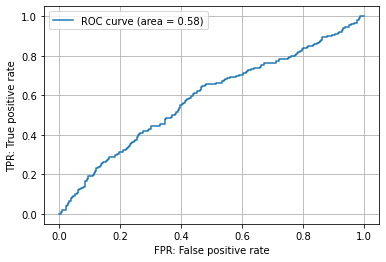

In [ ]:
# ROC曲線の描画
# cf : https://tips-memo.com/python-roc
from sklearn import metrics
from sklearn.metrics import roc_curve

fpr, tpr, thresholds = roc_curve(y_test,y_pred_prob)
auc = metrics.auc(fpr, tpr)
plt.plot(fpr, tpr, label='ROC curve (area = %.2f)'%auc)
plt.legend()
plt.xlabel('FPR: False positive rate')
plt.ylabel('TPR: True positive rate')
plt.grid()
plt.show()

In [ ]:
from imblearn.over_sampling import RandomOverSampler

rank_1= y_train.value_counts()[0]
rus = RandomOverSampler(sampling_strategy={0: rank_1, 1: rank_1}, random_state=71)
X_train_rus, y_train_rus = rus.fit_resample(X_train, y_train)
print(X_train_rus.value_counts())
print(y_train_rus.value_counts())

Gender  Age  N_P_EMT  ALS  Witness  P_Def  Type_AirM  P_DIV  Type_CA  Aet_NCCA  Floor_Site  PreRPOSC  Arr_Aw  CPR_Con  Dep_Con  AirM_Con  AH_Dep
1       77   2        2    1        0      2          1      2        5         1           1         540     0.0      8.0      120.0     420.0     13
             1        2    2        0      2          0      1        0         1           2         660     0.0      10.0     300.0     600.0     12
2       69   1        1    1        0      2          0      2        5         11          2         480     1020.0   23.0     1320.0    960.0     11
1       85   2        2    1        0      2          0      1        0         1           2         360     780.0    14.0     720.0     1260.0    11
        63   1        2    1        0      1          0      2        5         1           2         1200    0.0      16.0     900.0     4260.0    11
                                                                                                    

In [ ]:
transformer = StandardScaler()
X_trains = transformer.fit_transform(X_train_rus)
X_train.info()
#X_train.drop(columns="Fire_code","Sign_Death","Def_Con","Drug_Con","AirM_Con","Sigh_Death")


<class 'pandas.core.frame.DataFrame'>
Int64Index: 3926 entries, 4890 to 2726
Data columns (total 17 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   Gender      3926 non-null   int64   
 1   Age         3926 non-null   int64   
 2   N_P_EMT     3926 non-null   int64   
 3   ALS         3926 non-null   category
 4   Witness     3926 non-null   category
 5   P_Def       3926 non-null   category
 6   Type_AirM   3926 non-null   category
 7   P_DIV       3926 non-null   category
 8   Type_CA     3926 non-null   category
 9   Aet_NCCA    3926 non-null   category
 10  Floor_Site  3926 non-null   int64   
 11  PreRPOSC    3926 non-null   category
 12  Arr_Aw      3926 non-null   int64   
 13  CPR_Con     3780 non-null   float64 
 14  Dep_Con     3172 non-null   float64 
 15  AirM_Con    2342 non-null   float64 
 16  AH_Dep      3172 non-null   float64 
dtypes: category(8), float64(4), int64(5)
memory usage: 338.7 KB


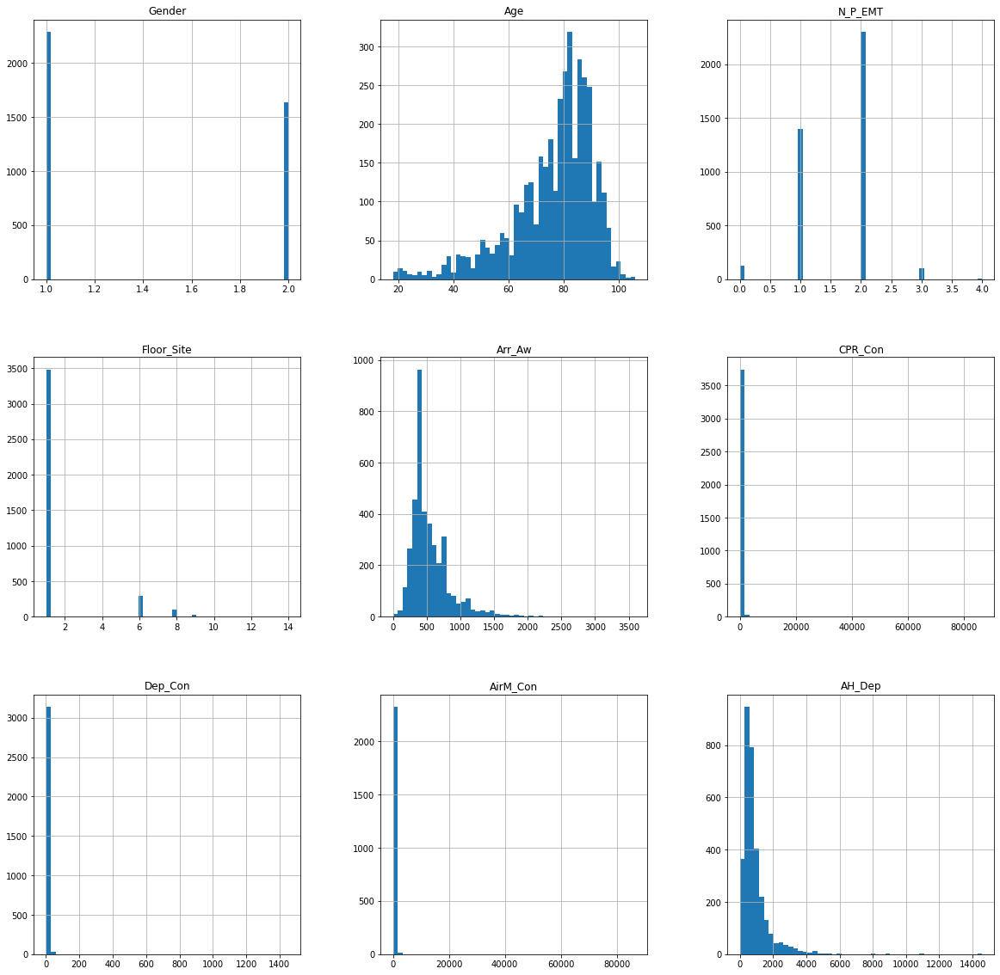

In [ ]:
X_train.hist(bins=50, figsize=(20,20));

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, confusion_matrix,  precision_score, recall_score, f1_score

In [ ]:
lr=LogisticRegression(solver='liblinear',  multi_class='auto')

lr.fit(X_train, y_train_rus)
y_pred = lr.predict(X_test)

print(confusion_matrix(y_test, y_pred)) # 混同行列
print(accuracy_score(y_test, y_pred)) # accuracy
print(precision_score(y_test, y_pred)) # precision
print(recall_score(y_test, y_pred)) # recall
print(f1_score(y_test, y_pred))  # f値

# 特徴量ごとのパラメータ重み
pd.DataFrame(lr.coef_, index=['weight'], columns=df.drop("Eval", axis=1).columns.values)
#print(model.coef_) # パラメータ重み
#print(model.intercept_) # バイアス重み

# print(model.predict_proba(norm_X_test)) # 各テストデータのラベル1or0であるかの確率の推定値

#print(confusion_matrix(y_test, y_pred)) # 混同行列
#print(accuracy_score(y_test, y_pred)) # accuracy
#print(precision_score(y_test, y_pred)) # precision
#print(recall_score(y_test, y_pred)) # recall
#print(f1_score(y_test, y_pred))  # f値

ValueError: ignored

In [ ]:
from sklearn.model_selection import train_test_split
import xgboost as xgb

#X = df.drop('Eval', axis=1)
#y = df['Eval'].values
#print(X)
#print(y)
#訓練データを訓練データとテストデータに分割
#X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, shuffle=True)


In [ ]:
params = {
    'silent': 1,
    'max_depth': 6, #木の深さに上限
    'min_child_weight': 1, #葉の重みの下限
    'eta': 0.1, #学習率(どのくらいのスピードで学習するか)
    'tree_method': 'exact',
    #'num_class':4,
    'objective': 'binary:logistic',
    #'objective': 'multi:softmax',
    'eval_metric': 'aucpr',
    'predictor': 'cpu_predictor'
}

dtrain = xgb.DMatrix(X_train, label=y_train)
dtest = xgb.DMatrix(X_test, label=y_test)

model = xgb.train(params=params,
                  dtrain=dtrain,
                  num_boost_round=1000, #1000個の決定木を重ねる
                  #nfold=5,
                  early_stopping_rounds=50,#5回連続で性能が上昇しなければそこで終了
                  #verbose_eval=True,
                  #stratified=True,
                  #shuffle=True
                  evals=[(dtrain, 'test')]
               )

ValueError: ignored

In [ ]:
pred = model.predict(dtest)
from sklearn.metrics import accuracy_score
pred_med = np.where(pred > 0.4, 1, 0)
acc = accuracy_score(y_test, pred_med)
print('Accuracy:', acc)
#from sklearn.metrics import accuracy_score
#score = accuracy_score(y_test, pred)
#rint('score:{0:.4f}'.format(score))

Accuracy: 0.827688651218063


In [ ]:
print(pd.Series(y_test), pd.Series(pred_med))

4669    0
1803    0
4128    0
2727    0
1398    0
       ..
1660    0
337     0
338     0
2596    0
5619    0
Name: Eval, Length: 1683, dtype: int64 0       1
1       0
2       0
3       1
4       0
       ..
1678    0
1679    0
1680    0
1681    0
1682    0
Length: 1683, dtype: int64


In [ ]:
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score,recall_score,f1_score
print('confusion matrix = \n', confusion_matrix(y_true = y_test, y_pred = pred_med))
print('accuracy = ',accuracy_score(y_true = y_test , y_pred = pred_med))
#Spかなり低いがまあ大丈夫か　偽陽性が多い

confusion matrix = 
 [[1370   87]
 [ 203   23]]
accuracy =  0.827688651218063


In [ ]:
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
import matplotlib.pyplot as plt

fpr, tpr, thresholds = roc_curve(y_test, pred)

print(roc_auc_score(y_test, pred))
print(fpr)
print(tpr)
print(thresholds)

0.5605772559690477
[0.00000000e+00 6.86341798e-04 6.86341798e-04 1.37268360e-03
 1.37268360e-03 5.49073439e-03 5.49073439e-03 6.17707618e-03
 6.17707618e-03 8.23610158e-03 8.23610158e-03 1.37268360e-02
 1.37268360e-02 1.71585450e-02 1.71585450e-02 2.33356211e-02
 2.33356211e-02 2.47083047e-02 2.47083047e-02 2.60809883e-02
 2.60809883e-02 3.56897735e-02 3.56897735e-02 3.70624571e-02
 3.70624571e-02 4.25531915e-02 4.25531915e-02 4.39258751e-02
 4.39258751e-02 4.73575841e-02 4.73575841e-02 4.87302677e-02
 4.87302677e-02 5.14756349e-02 5.14756349e-02 5.35346603e-02
 5.35346603e-02 6.03980782e-02 6.03980782e-02 6.10844200e-02
 6.10844200e-02 6.17707618e-02 6.17707618e-02 6.86341798e-02
 6.86341798e-02 7.00068634e-02 7.00068634e-02 7.82429650e-02
 7.82429650e-02 9.33424846e-02 9.33424846e-02 9.81468771e-02
 9.81468771e-02 1.02264928e-01 1.02264928e-01 1.05696637e-01
 1.05696637e-01 1.07069321e-01 1.07069321e-01 1.11187371e-01
 1.11187371e-01 1.22168840e-01 1.22168840e-01 1.22855182e-01
 1.22

In [ ]:
print(y_test,pred)


4669    0
1803    0
4128    0
2727    0
1398    0
       ..
1660    0
337     0
338     0
2596    0
5619    0
Name: Eval, Length: 1683, dtype: int64 [0.4406574  0.15418376 0.05310784 ... 0.2353685  0.002228   0.09619474]


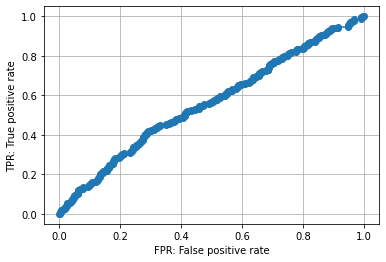

In [ ]:
plt.plot(fpr, tpr, marker='o')
plt.xlabel('FPR: False positive rate')
plt.ylabel('TPR: True positive rate')
plt.grid()


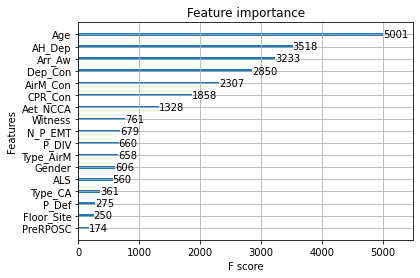

In [ ]:
xgb.plot_importance(model)